# Прекод

# Сборный проект-4

Вам поручено разработать демонстрационную версию поиска изображений по запросу.

Для демонстрационной версии нужно обучить модель, которая получит векторное представление изображения, векторное представление текста, а на выходе выдаст число от 0 до 1 — покажет, насколько текст и картинка подходят друг другу.

### Описание данных

Данные находятся [здесь](https://code.s3.yandex.net/datasets/dsplus_integrated_project_4.zip).

В файле `train_dataset.csv` собрана информация, необходимая для обучения: имя файла изображения, идентификатор описания и текст описания. Для одной картинки может быть доступно до 5 описаний. Идентификатор описания имеет формат `<имя файла изображения>#<порядковый номер описания>`.

В папке `train_images` содержатся изображения для тренировки модели.

В файле `CrowdAnnotations.tsv` — данные по соответствию изображения и описания, полученные с помощью краудсорсинга. Номера колонок и соответствующий тип данных:

1. Имя файла изображения.
2. Идентификатор описания.
3. Доля людей, подтвердивших, что описание соответствует изображению.
4. Количество человек, подтвердивших, что описание соответствует изображению.
5. Количество человек, подтвердивших, что описание не соответствует изображению.

В файле `ExpertAnnotations.tsv` содержатся данные по соответствию изображения и описания, полученные в результате опроса экспертов. Номера колонок и соответствующий тип данных:

1. Имя файла изображения.
2. Идентификатор описания.

3, 4, 5 — оценки трёх экспертов.

Эксперты ставят оценки по шкале от 1 до 4, где 1 — изображение и запрос совершенно не соответствуют друг другу, 2 — запрос содержит элементы описания изображения, но в целом запрос тексту не соответствует, 3 — запрос и текст соответствуют с точностью до некоторых деталей, 4 — запрос и текст соответствуют полностью.

В файле `test_queries.csv` находится информация, необходимая для тестирования: идентификатор запроса, текст запроса и релевантное изображение. Для одной картинки может быть доступно до 5 описаний. Идентификатор описания имеет формат `<имя файла изображения>#<порядковый номер описания>`.

В папке `test_images` содержатся изображения для тестирования модели.

In [22]:
# Импортируем необходимые библиотеки
import pandas as pd
import numpy as np
import os
import re
import random
import matplotlib.pyplot as plt

from IPython.display import Image, display
from sklearn.decomposition import PCA

import torch
import torchvision.models as models
import torchvision.transforms as transforms
from torch.autograd import Variable
from PIL import Image

from transformers import BertTokenizer, BertModel

from sklearn.model_selection import GroupShuffleSplit

from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error
from sklearn.preprocessing import MinMaxScaler


from sklearn.model_selection import train_test_split
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader, TensorDataset
from math import ceil

from transformers import CLIPProcessor, CLIPModel

## 1. Исследовательский анализ данных

Наш датасет содержит экспертные и краудсорсинговые оценки соответствия текста и изображения.

В файле с экспертными мнениями для каждой пары изображение-текст имеются оценки от трёх специалистов. Для решения задачи вы должны эти оценки агрегировать — превратить в одну. Существует несколько способов агрегации оценок, самый простой — голосование большинства: за какую оценку проголосовала большая часть экспертов (в нашем случае 2 или 3), та оценка и ставится как итоговая. Поскольку число экспертов меньше числа классов, может случиться, что каждый эксперт поставит разные оценки, например: 1, 4, 2. В таком случае данную пару изображение-текст можно исключить из датасета.

Вы можете воспользоваться другим методом агрегации оценок или придумать свой.

В файле с краудсорсинговыми оценками информация расположена в таком порядке: 

1. Доля исполнителей, подтвердивших, что текст **соответствует** картинке. 
2. Количество исполнителей, подтвердивших, что текст **соответствует** картинке.
3. Количество исполнителей, подтвердивших, что текст **не соответствует** картинке.

После анализа экспертных и краудсорсинговых оценок выберите либо одну из них, либо объедините их в одну по какому-то критерию: например, оценка эксперта принимается с коэффициентом 0.6, а крауда — с коэффициентом 0.4.

Ваша модель должна возвращать на выходе вероятность соответствия изображения тексту, поэтому целевая переменная должна иметь значения от 0 до 1.


Для начала ознакомимся с предоставленными данными:

Содержимое файла ExpertAnnotations.tsv:
                       image               description_id  expert_1_rate  \
0  1056338697_4f7d7ce270.jpg  2549968784_39bfbe44f9.jpg#2              1   
1  1056338697_4f7d7ce270.jpg  2718495608_d8533e3ac5.jpg#2              1   
2  1056338697_4f7d7ce270.jpg  3181701312_70a379ab6e.jpg#2              1   
3  1056338697_4f7d7ce270.jpg  3207358897_bfa61fa3c6.jpg#2              1   
4  1056338697_4f7d7ce270.jpg  3286822339_5535af6b93.jpg#2              1   
5  1056338697_4f7d7ce270.jpg  3360930596_1e75164ce6.jpg#2              1   
6  1056338697_4f7d7ce270.jpg  3545652636_0746537307.jpg#2              1   
7  1056338697_4f7d7ce270.jpg   434792818_56375e203f.jpg#2              1   
8   106490881_5a2dd9b7bd.jpg  1425069308_488e5fcf9d.jpg#2              1   
9   106490881_5a2dd9b7bd.jpg  1714316707_8bbaa2a2ba.jpg#2              2   

   expert_2_rate  expert_3_rate  
0              1              1  
1              1              2  
2              1     

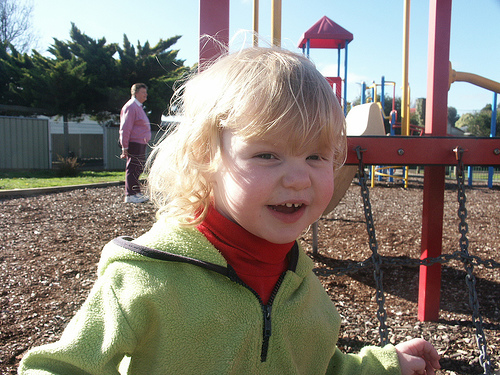

Изображение 2: 989754491_7e53fb4586.jpg


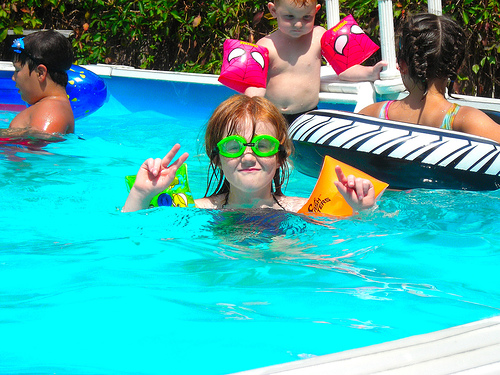

Изображение 3: 3517023411_a8fbd15230.jpg


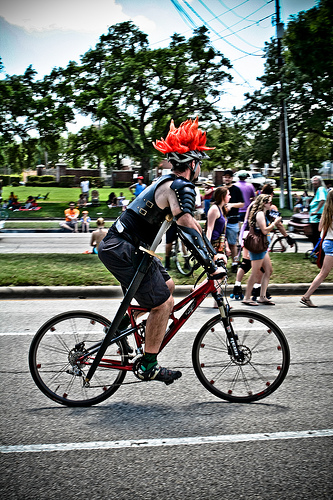

Изображение 4: 3122579598_14841c038a.jpg


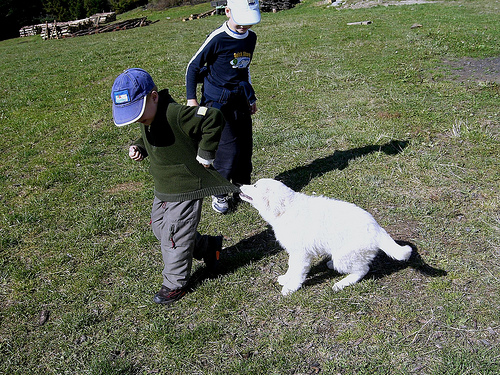

Изображение 5: 269650644_059a84ece5.jpg


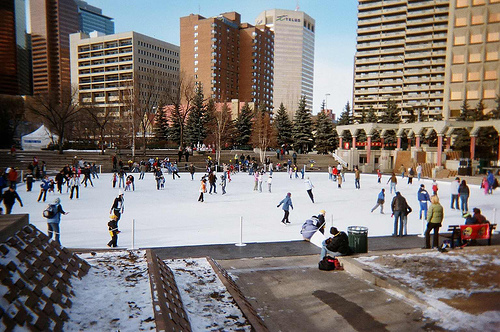



Содержимое файла test_queries.csv:
   Unnamed: 0                     query_id  \
0           0  1177994172_10d143cb8d.jpg#0   
1           1  1177994172_10d143cb8d.jpg#1   
2           2  1177994172_10d143cb8d.jpg#2   
3           3  1177994172_10d143cb8d.jpg#3   
4           4  1177994172_10d143cb8d.jpg#4   
5           5  1232148178_4f45cc3284.jpg#0   
6           6  1232148178_4f45cc3284.jpg#1   
7           7  1232148178_4f45cc3284.jpg#2   
8           8  1232148178_4f45cc3284.jpg#3   
9           9  1232148178_4f45cc3284.jpg#4   

                                          query_text  \
0  Two blonde boys , one in a camouflage shirt an...   
1  Two boys are squirting water guns at each other .   
2            Two boys spraying each other with water   
3  Two children wearing jeans squirt water at eac...   
4  Two young boys are squirting water at each oth...   
5                    A baby girl playing at a park .   
6  A closeup of a child on a playground with adul...   
7  A you

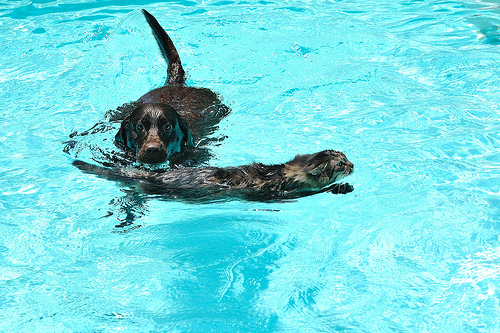

Изображение 2: 3123463486_f5b36a3624.jpg


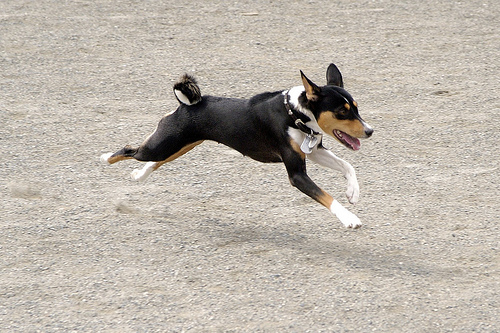

Изображение 3: 354642192_3b7666a2dd.jpg


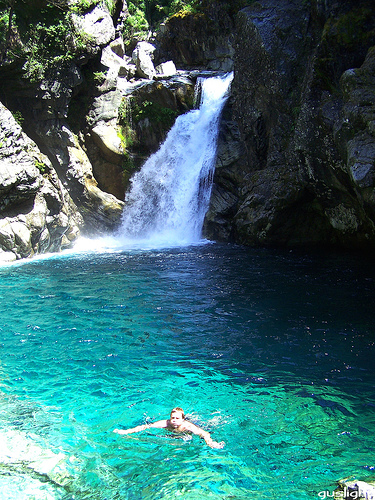

Изображение 4: 3217266166_4e0091860b.jpg


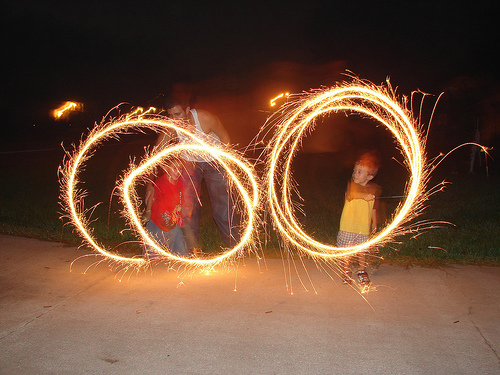

Изображение 5: 1056338697_4f7d7ce270.jpg


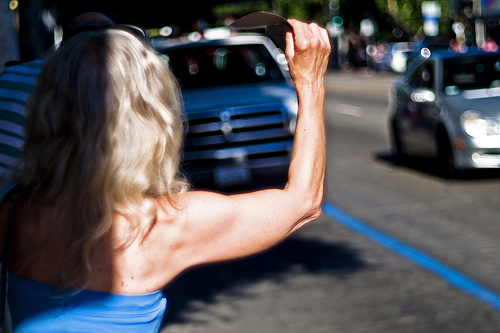



Содержимое файла CrowdAnnotations.tsv:
                       image               description_id  agree_fract  \
0  1056338697_4f7d7ce270.jpg  1056338697_4f7d7ce270.jpg#2     1.000000   
1  1056338697_4f7d7ce270.jpg   114051287_dd85625a04.jpg#2     0.000000   
2  1056338697_4f7d7ce270.jpg  1427391496_ea512cbe7f.jpg#2     0.000000   
3  1056338697_4f7d7ce270.jpg  2073964624_52da3a0fc4.jpg#2     0.000000   
4  1056338697_4f7d7ce270.jpg  2083434441_a93bc6306b.jpg#2     0.000000   
5  1056338697_4f7d7ce270.jpg  2204550058_2707d92338.jpg#2     0.000000   
6  1056338697_4f7d7ce270.jpg  2224450291_4c133fabe8.jpg#2     0.000000   
7  1056338697_4f7d7ce270.jpg  2248487950_c62d0c81a9.jpg#2     0.333333   
8  1056338697_4f7d7ce270.jpg  2307118114_c258e3a47e.jpg#2     0.000000   
9  1056338697_4f7d7ce270.jpg  2309860995_c2e2a0feeb.jpg#2     0.000000   

   agree_count  disagree_count  
0            3               0  
1            0               3  
2            0               3  
3           

In [28]:
# Устанавливаем рабочую директорию
data_dir = 'to_upload'

# Обрабатываем ошибку ParserError при чтении CSV и TSV файлов
for file_name in os.listdir(data_dir):
    file_path = os.path.join(data_dir, file_name)
    if os.path.isfile(file_path):
        if file_name.endswith(('.csv', '.tsv')):
            try:
                # Определяем стандартные имена столбцов
                column_names = None

                # Проверяем, содержит ли имя файла 'CrowdAnnotations'
                if 'CrowdAnnotations' in file_name:
                    variable_name = 'crowd_annotations'
                    column_names = ['image', 'description_id', 'agree_fract', 'agree_count', 'disagree_count']
                # Проверяем, содержит ли имя файла 'ExpertAnnotations'
                elif 'ExpertAnnotations' in file_name:
                    variable_name = 'expert_annotations'
                    column_names = ['image', 'description_id', 'expert_1_rate', 'expert_2_rate', 'expert_3_rate']
                else:
                    # Преобразуем имя файла в переменную с соответствующим именем
                    variable_name = file_name.split('.')[0].lower().replace(' ', '_')

                # Читаем файл и сохраняем его в переменную
                if column_names is not None:
                    globals()[variable_name] = pd.read_csv(file_path, sep='\t' if file_name.endswith('.tsv') else '|', names=column_names)
                elif variable_name == 'train_dataset':
                    globals()[variable_name] = pd.read_csv(file_path, sep=',')
                else:
                    globals()[variable_name] = pd.read_csv(file_path, sep='|')

                print(f"Содержимое файла {file_name}:")
                # Выводим первые 10 строк DataFrame
                print(globals()[variable_name].head(10))
                print("\n" + "="*40 + "\n")  # Добавляем разделитель после вывода данных
            except pd.errors.ParserError as e:
                print(f"Ошибка при чтении файла {file_name}: {str(e)}")
                with open(file_path, 'r') as file:
                    lines = file.readlines()
                    problematic_lines = [line for i, line in enumerate(lines) if i >= 72 and i <= 74]
                    print(f"Проблемные строки в файле {file_name}:")
                    for line in problematic_lines:
                        print(line.strip())
                    print("\n" + "="*40 + "\n")  # Добавляем разделитель после вывода данных
        else:
            print(f"Обнаружен файл: {file_name}")
    elif os.path.isdir(file_path):
        if "images" in file_name.lower():
            image_files = os.listdir(file_path)
            num_images = len(image_files)  # Общее количество файлов в папке 

            print(f"Общее количество файлов в папке с изображениями {file_name}: {num_images}")
    
            print(f"Примеры изображений:")
            for i, image_file in enumerate(image_files[:5], start=1):
                print(f"Изображение {i}: {image_file}")
        
                # Проверяем, что файл имеет расширение изображения
                image_extensions = ['.jpg', '.jpeg', '.png', '.gif']
                if any(image_file.lower().endswith(ext) for ext in image_extensions):
                    image_path = os.path.join(file_path, image_file)
                    image = Image.open(image_path)
                    display(image)
        print("\n" + "="*40 + "\n")  # Добавляем разделитель после вывода данных
    else:
        print(f"Неизвестный тип файла: {file_name}")

# Теперь данные доступны как отдельные переменные с именами в стиле snake_case


In [29]:
# ANSI escape коды для изменения цвета текста и добавления жирного начертания
BLUE = '\033[94m'
BOLD = '\033[1m'  # Жирное начертание
ENDC = '\033[0m'

In [31]:
def explore_dataframes(dataframes):
    for df_name, df in dataframes.items():
        print(f"{BOLD}{BLUE}Exploring {df_name}:{ENDC}")
        print(f"{BOLD}{BLUE}{'='*40}\n{ENDC}")
        
        # Вывод первых 3 строк
        print(f"First 3 rows of {df_name}:")
        print(df.head(3))
        print(f"\n{'-'*40}\n")
        
        # Информация о DataFrame
        print(f"Info for {df_name}:")
        print(df.info())
        print(f"\n{'-'*40}\n")
        
        # Проверка на дубликаты
        print(f"Duplicated rows in {df_name}:")
        duplicated_rows = df[df.duplicated()]
        if not duplicated_rows.empty:
            print(duplicated_rows)
        else:
            print("No duplicated rows found.")
            print(df.duplicated().sum())
        print(f"\n{'-'*40}\n")
        
        # Проверка на пропущенные значения
        print(f"Missing values in {df_name}:")
        missing_values = df.isnull().sum()
        if not missing_values.empty:
            print(missing_values)
        else:
            print("No missing values found.")
        
        print(f"{BOLD}{BLUE}\n{'='*40}\n{ENDC}")

# Создадим словарь с именами и соответствующими им DataFrame
dataframes = {
    'Train Dataset': train_dataset,
    'Crowd Annotations': crowd_annotations,
    'Expert Annotations': expert_annotations,
    'Test Queries': test_queries
}

# Вызовем функцию для анализа данных в каждом DataFrame
explore_dataframes(dataframes)


Exploring Train Dataset:

First 3 rows of Train Dataset:
                       image                     query_id  \
0  1056338697_4f7d7ce270.jpg  2549968784_39bfbe44f9.jpg#2   
1  1262583859_653f1469a9.jpg  2549968784_39bfbe44f9.jpg#2   
2  2447284966_d6bbdb4b6e.jpg  2549968784_39bfbe44f9.jpg#2   

                                          query_text  
0  A young child is wearing blue goggles and sitt...  
1  A young child is wearing blue goggles and sitt...  
2  A young child is wearing blue goggles and sitt...  

----------------------------------------

Info for Train Dataset:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5822 entries, 0 to 5821
Data columns (total 3 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   image       5822 non-null   object
 1   query_id    5822 non-null   object
 2   query_text  5822 non-null   object
dtypes: object(3)
memory usage: 136.6+ KB
None

----------------------------------------

Duplicated rows

Мы видим, что экспертных оценок значительно меньше, чем краудсорсинговых. Большее доверие вызывают оценки от экспертов. Попробуем аггрегировать их как предложено и посмотрим, сколько оценок сохранится по итогу слияния двух датасетов.

In [32]:
def aggregate_expert_ratings(ratings):
    # Проверяем, есть ли хотя бы две одинаковые оценки
    if ratings[0] == ratings[1] or ratings[0] == ratings[2]:
        return ratings[0]
    elif ratings[1] == ratings[2]:
        return ratings[1]
    else:
        # Если все оценки разные, возвращаем None для исключения из датасета
        return None

In [33]:
# Создаем новый столбец с итоговыми оценками экспертов
expert_annotations['final_rating'] = expert_annotations[['expert_1_rate', 'expert_2_rate', 'expert_3_rate']].apply(aggregate_expert_ratings, axis=1)

# Определим количество строк до удаления
rows_before = expert_annotations.shape[0]

# Удалим строки с None в столбце final_rating, т.е спорные оценки
expert_annotations = expert_annotations.dropna(subset=['final_rating'])

# Определим количество строк после удаления
rows_after = expert_annotations.shape[0]

# Выведим количество удаленных строк
deleted_rows = rows_before - rows_after
print(f'Удалено {deleted_rows} строк из {rows_before}.')

Удалено 126 строк из 5822.


Спорных оценок оказалось немного, это хорошо. Двигаемся дальше, посмотрим на распределение оценок, нормируем их перед слиянием с краудсорсинговыми.

In [35]:
expert_annotations['final_rating'].value_counts()

1.0    3327
2.0    1566
3.0     492
4.0     311
Name: final_rating, dtype: int64

In [36]:
expert_annotations_copy = expert_annotations.copy()

min_value = expert_annotations_copy['final_rating'].min()
max_value = expert_annotations_copy['final_rating'].max()

expert_annotations_copy['final_rating_normalized'] = (expert_annotations_copy['final_rating'] - min_value) / (max_value - min_value)

In [37]:
expert_annotations_copy['final_rating_normalized'].value_counts()

0.000000    3327
0.333333    1566
0.666667     492
1.000000     311
Name: final_rating_normalized, dtype: int64

In [38]:
# Вычисляем среднее значение оценок от краудсорсинга
crowd_annotations['crowd_mean_rating'] = crowd_annotations['agree_fract'] * 0.4

# Вычисляем среднее значение агрегированных оценок экспертов
expert_annotations_copy['expert_mean_rating'] = expert_annotations_copy['final_rating_normalized'] * 0.6

# Объединяем оценки с учетом весов
#crowd_annotations_notnull = crowd_annotations[crowd_annotations['crowd_mean_rating'] != 0]
crowd_weighted = crowd_annotations[['image', 'description_id', 'crowd_mean_rating']]

expert_weighted = expert_annotations_copy[['image', 'description_id', 'expert_mean_rating']]
#merged_ratings = expert_weighted.merge(crowd_weighted, on=['image', 'description_id'], how='left')
merged_ratings = expert_weighted.merge(crowd_weighted, on=['image', 'description_id'], how='inner')

# Вычисляем итоговую оценку как сумму взвешенных оценок
merged_ratings['final_rating'] = (merged_ratings['crowd_mean_rating'] + merged_ratings['expert_mean_rating'])

# В итоге получаем DataFrame с итоговыми оценками
final_ratings = merged_ratings[['image', 'description_id', 'final_rating']]
final_ratings = final_ratings.rename(columns={'description_id': 'query_id'})


In [39]:
final_ratings['final_rating'].value_counts()

0.200000    805
0.000000    599
1.000000    224
0.400000    179
0.533333    142
0.333333     79
0.666667     73
0.866667     62
0.800000     35
0.466667     18
0.733333     18
0.600000      5
0.133333      4
0.500000      2
0.280000      2
0.560000      2
0.400000      2
0.720000      2
0.300000      2
0.700000      2
0.100000      1
Name: final_rating, dtype: int64

Разброс оценок получился широкий, некоторые представлены в очень малом количестве, некоторые даже единично. Общее количество оценок говорит о большой потере информации. Можно было бы поработать с оценками отдельно и максимально сохранить все оценки, заменив отсутствующие в общем датасете значения на предугаданные моделью, к примеру, логистической регрессии (были подобные примеры). Честно говоря, такой путь видится чрезмерно усложненным и требующим бОльших временных ресурсов, которые на данный момент ограничены.


Поэтому воспользуемся скромным датасетом и попробуем разобраться, возможно ли в принципе создать эффективный прототип по поиску изображений по запросу при таком подходе.

Выведем несколько изображений и посмотрим на оценки.

In [43]:
def display_random_samples(images_folder, dataset, final_ratings=None, crowd_annotations=None, expert_annotations=None, sample_size=5):
    print(f"{BOLD}{BLUE}Random Samples from Dataset:{ENDC}")
    print(f"{BOLD}{BLUE}{'='*40}\n{ENDC}")
    
    # Получаем случайные примеры из датасета
    sample_dataset = dataset.sample(sample_size)
    
    for _, row in sample_dataset.iterrows():
        image_path = os.path.join(images_folder, row['image'])
        image = Image.open(image_path)
        display(image)
        print("Image:", row['image'])
        print("Query ID:", row['query_id'])
        print("Query Text:", row['query_text'])
        
        image_name = row['image']
        query_id = row['query_id']
        
        if final_ratings is not None and image_name in final_ratings['image'].values and query_id in final_ratings['query_id'].values:
            matching_row = final_ratings.loc[(final_ratings['image'] == image_name) & (final_ratings['query_id'] == query_id), 'final_rating']
    
            if not matching_row.empty:
                final_rating = matching_row.values[0]
                print("Final Rating:", final_rating)
            else:
                print("Final rating not available.")
        else:
            print("Final rating not available.")
        
        if image_name in crowd_annotations['image'].values and query_id in crowd_annotations['description_id'].values:
            matching_row = crowd_annotations.loc[(crowd_annotations['image'] == image_name) & (crowd_annotations['description_id'] == query_id), 'agree_fract']

            if not matching_row.empty:
                crowd_agree_fraction = matching_row.values[0]
                print("Crowd Agree Fraction:", crowd_agree_fraction)
            else:
                print("Crowd Agree Fraction not available.")
        else:
            print("No matching row found in crowd_annotations.")
        
        if image_name in expert_annotations['image'].values and query_id in expert_annotations['description_id'].values:
            matching_row = expert_annotations.loc[(expert_annotations['image'] == image_name) & (expert_annotations['description_id'] == query_id)]

            if not matching_row.empty:
                expert_1_rate = matching_row['expert_1_rate'].values[0]
                expert_2_rate = matching_row['expert_2_rate'].values[0]
                expert_3_rate = matching_row['expert_3_rate'].values[0]

            expert_ratings = [expert_1_rate, expert_2_rate, expert_3_rate]
            expert_mean_rate = aggregate_expert_ratings(expert_ratings)

            if expert_mean_rate is not None:
                print("Expert Aggregated Rate:", expert_mean_rate)
            else:
                print("Expert Aggregated Rate could not be calculated.")
        else:
            print("No matching row found in expert_annotations.")
        
        print("\n")


Random Samples from Dataset:



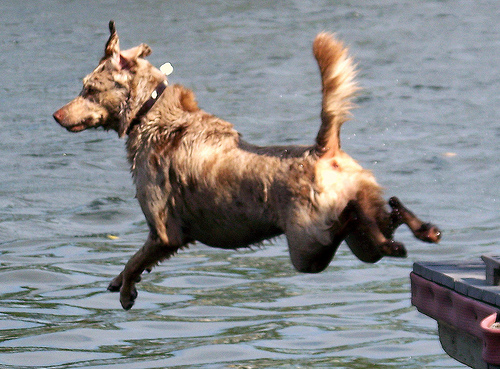

Image: 493621130_152bdd4e91.jpg
Query ID: 1517721825_10176d0683.jpg#2
Query Text: Three dogs running through water .
Final Rating: 0.19999999999999998
Crowd Agree Fraction: 0.0
Expert Aggregated Rate: 2




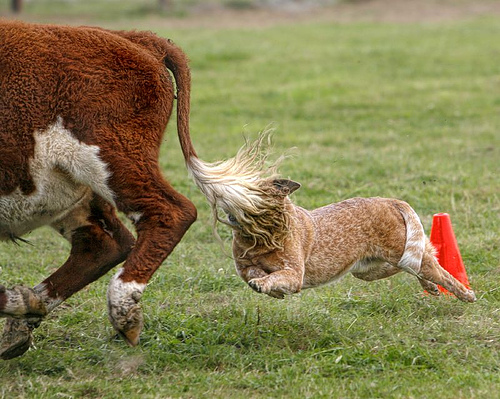

Image: 2170222061_e8bce4a32d.jpg
Query ID: 430173345_86388d8822.jpg#2
Query Text: A brown dog with a purple Frisbee in its mouth .
Final Rating: 0.19999999999999998
Crowd Agree Fraction: 0.0
Expert Aggregated Rate: 2




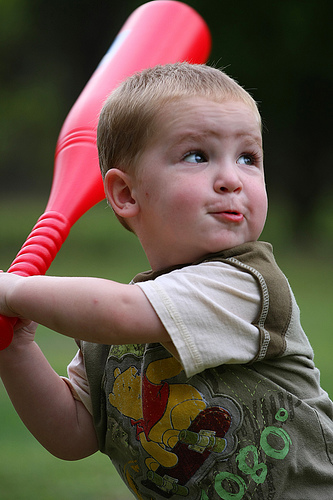

Image: 2648165716_02e2e74fd6.jpg
Query ID: 3361990489_92244a58ef.jpg#2
Query Text: girl posing on tree
Final rating not available.
Crowd Agree Fraction not available.
Expert Aggregated Rate: 1




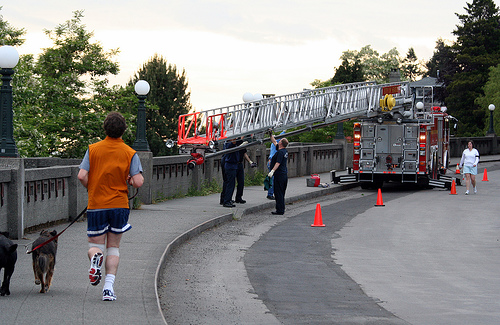

Image: 542179694_e170e9e465.jpg
Query ID: 791338571_7f38510bf7.jpg#2
Query Text: A red car parked next to a cow in a field .
Final Rating: 0.0
Crowd Agree Fraction: 0.0
Expert Aggregated Rate: 1




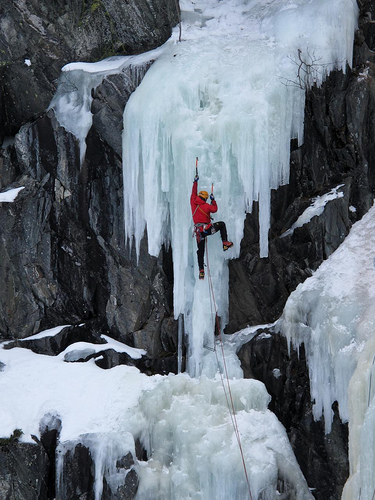

Image: 3429956016_3c7e3096c2.jpg
Query ID: 2218609886_892dcd6915.jpg#2
Query Text: A man wearing a dark blue hat sits on the ground and leans against a building .
Final rating not available.
Crowd Agree Fraction not available.
Expert Aggregated Rate: 1




In [44]:
train_images_folder = 'to_upload/train_images'

# Для тренировочных данных с аннотациями
display_random_samples(train_images_folder, train_dataset, final_ratings, crowd_annotations, expert_annotations)

Теперь посмотрим на распределение оценок, есть ли дисбаланс.

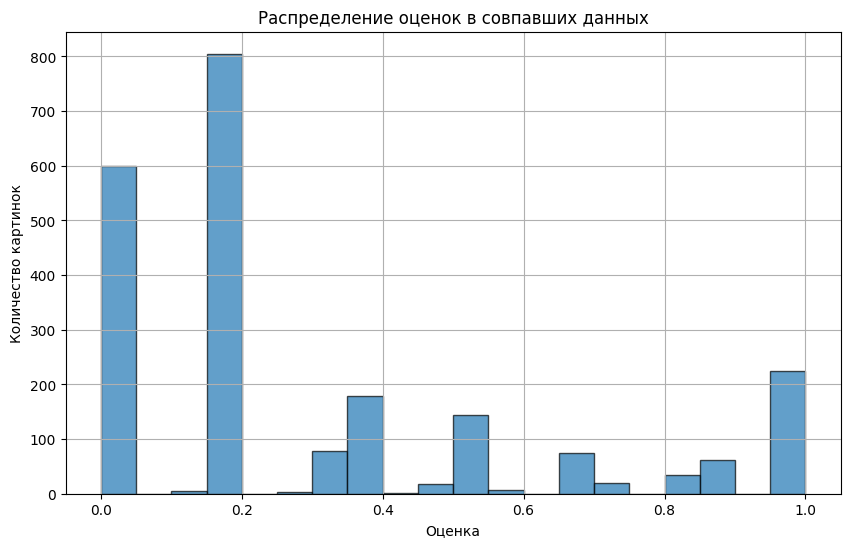

In [46]:
# Объединяем final_ratings и train_dataset по колонкам 'image', 'query_id'
train_dataset_rated = final_ratings.merge(train_dataset, on=['image', 'query_id'], how='inner')

# Создаем гистограмму распределения оценок
plt.figure(figsize=(10, 6))
plt.hist(train_dataset_rated['final_rating'], bins=20, edgecolor='k', alpha=0.7)
plt.xlabel('Оценка')
plt.ylabel('Количество картинок')
plt.title('Распределение оценок в совпавших данных')
plt.grid(True)
plt.show()

Действительно, дисбаланс есть. В основном фотографии либо полностью не соответствуют описанию, либо слабо соответствуют. Доля полностью соответствующих описанию фото очень скромная.

## 2. Проверка данных

В некоторых странах, где работает ваша компания, действуют ограничения по обработке изображений: поисковым сервисам и сервисам, предоставляющим возможность поиска, запрещено без разрешения родителей или законных представителей предоставлять любую информацию, в том числе, но не исключительно тексты, изображения, видео и аудио, содержащие описание, изображение или запись голоса детей. Ребёнком считается любой человек, не достигший 16 лет.

В вашем сервисе строго следуют законам стран, в которых работают. Поэтому при попытке посмотреть изображения, запрещённые законодательством, вместо картинок показывается дисклеймер:

> This image is unavailable in your country in compliance with local laws
> 

Однако у вас в PoC нет возможности воспользоваться данным функционалом. Поэтому все изображения, которые нарушают данный закон, нужно удалить из обучающей выборки.

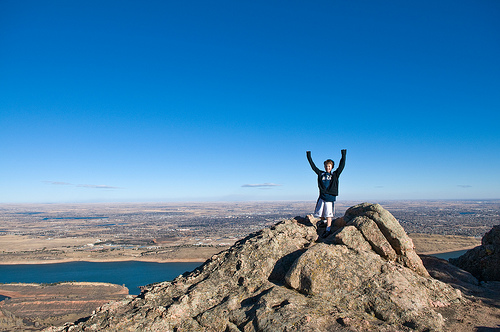

Query ID: 3442242092_e579538d82.jpg#2
Query Text: The Asian girl wearing a pink and black striped top is walking next to the girl in the grey top .


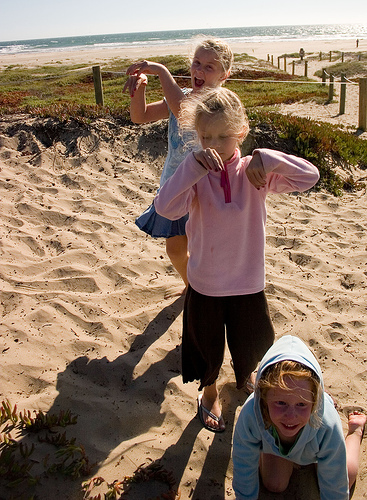

Query ID: 2878190821_6e4e03dc5f.jpg#2
Query Text: A young child with a dirty shirt is standing on a playground


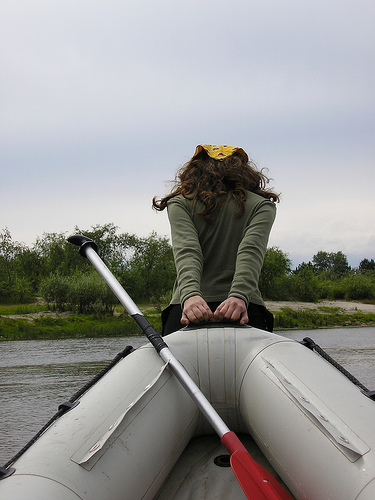

Query ID: 3484649669_7bfe62080b.jpg#2
Query Text: A young girl plays in fountain water .


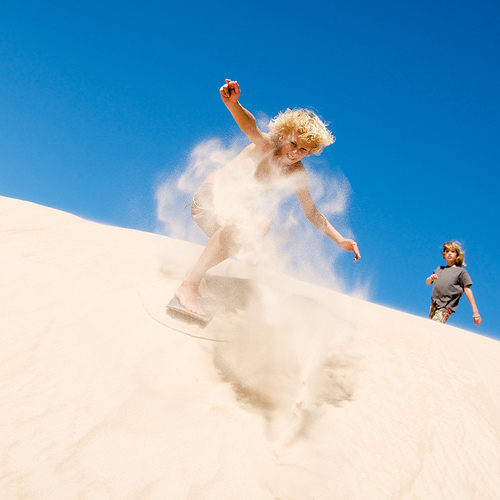

Query ID: 2443380641_7b38d18f5b.jpg#2
Query Text: A young boy is getting ready to hit a baseball .


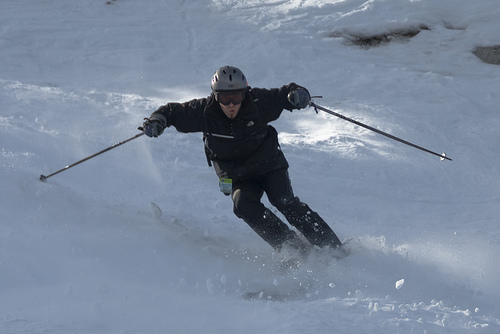

Query ID: 2288099178_41091aa00c.jpg#2
Query Text: Two boys on ice skates race on an outdoor ice rink .


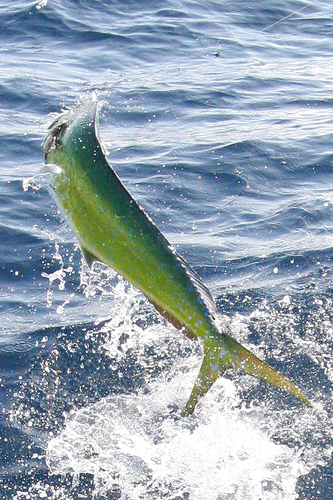

Query ID: 2559921948_06af25d566.jpg#2
Query Text: a little boy at the beach with a surfboard


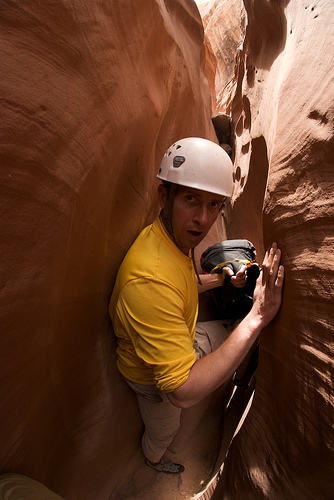

Query ID: 2842865689_e37256d9ce.jpg#2
Query Text: The person in the yellow shirt is sitting with a child at a wooden picnic table .

Удалено 517 строк из 2258.


In [49]:
# Кодовые слова на английском, по которым будем фильтровать изображения
forbidden_keywords = [r'\bchild\b', r'\bchildren\b', r'\bbaby\b', r'\bbabies\b', r'\binfant\b', r'\binfants\b', r'\bkid\b', r'\bkids\b',
                      r'\bteenager\b', r'\bteenagers\b', r'\bgirl\b', r'\bgirls\b', r'\bboy\b', r'\bboys\b', 
                      r'\btoddler\b', r'\btoddlers\b', r'\bnewborn\b', r'\bnewborns\b']

# Функция для проверки, содержит ли текст запрещенные ключевые слова
def contains_forbidden_keywords(text):
    text = text.lower()  # Приводим текст к нижнему регистру для более точного сравнения
    for keyword in forbidden_keywords:
        if re.search(keyword, text):
            #print("This image is unavailable in your country in compliance with local laws")
            # Используем re.search для поиска по регулярному выражению
            return True
    return False

# Применяем функцию к датасету и создаем новый столбец 'contains_forbidden_keywords'
train_dataset_rated['contains_forbidden_keywords'] = train_dataset_rated['query_text'].apply(contains_forbidden_keywords)

# Фильтруем изображения, где текст содержит запрещенные ключевые слова
filtered_dataset = train_dataset_rated[train_dataset_rated['contains_forbidden_keywords']]

# Выбираем случайные 5-10 изображений с описаниями для просмотра перед удалением
sample_to_check = filtered_dataset.sample(min(random.randint(5, 10), len(filtered_dataset)))

for _, row in sample_to_check.iterrows():
    image_path = os.path.join(train_images_folder, row['image'])
    image = Image.open(image_path)
    display(image)
    print("Query ID:", row['query_id'])
    print("Query Text:", row['query_text'])

# Определяем количество строк до удаления
rows_before = train_dataset_rated.shape[0]

# Удаляем изображения, где текст содержит запрещенные ключевые слова
train_dataset_rated = train_dataset_rated[~(train_dataset_rated['contains_forbidden_keywords'])]

# Определяем количество строк после удаления
rows_after = train_dataset_rated.shape[0]

# Выводим количество удаленных строк
deleted_rows = rows_before - rows_after
print(f'\nУдалено {deleted_rows} строк из {rows_before}.')

# Удаляем временный столбец 'contains_forbidden_keywords'
train_dataset_censored = train_dataset_rated.drop(columns=['contains_forbidden_keywords'])

В датасете присутствует практически четверть запросов, в которых есть упоминание изображения несовершеннолетних. Это большая доля, но такие запросы пришлось удалить во избежание нарушения закона. Как мы видим, не всегда описание и фото совпадают между собой, что наводит на мысль, что некоторые фото с детьми могли остаться в датасете. Это может стать проблемой.

In [48]:
train_dataset_censored.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1741 entries, 2 to 2257
Data columns (total 4 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   image         1741 non-null   object 
 1   query_id      1741 non-null   object 
 2   final_rating  1741 non-null   float64
 3   query_text    1741 non-null   object 
dtypes: float64(1), object(3)
memory usage: 68.0+ KB


In [50]:
len(train_dataset_censored['image'].unique())

764

Осталось 1741 примеров для обучения и 764 фотографии для запросов.

## 3. Векторизация изображений

Перейдём к векторизации изображений.

Самый примитивный способ — прочесть изображение и превратить полученную матрицу в вектор. Такой способ нам не подходит: длина векторов может быть сильно разной, так как размеры изображений разные. Поэтому стоит обратиться к свёрточным сетям: они позволяют "выделить" главные компоненты изображений. Как это сделать? Нужно выбрать какую-либо архитектуру, например ResNet-18, посмотреть на слои и исключить полносвязные слои, которые отвечают за конечное предсказание. При этом можно загрузить модель данной архитектуры, предварительно натренированную на датасете ImageNet.

In [52]:
TRAIN_IMAGE_FOLDER = "to_upload/train_images"
TEST_IMAGE_FOLDER = "to_upload/test_images"
MIN_DIMENSION = 768

In [53]:
def vectorize_image(image_path, image_folders):
    # Загружаем предобученную модель ResNet-50
    resnet50 = models.resnet50(pretrained=True)

    # Удаляем последний слой, который отвечает за классификацию
    modules = list(resnet50.children())[:-1]
    resnet50 = torch.nn.Sequential(*modules)

    # Переключаем модель в режим оценки (evaluation)
    resnet50.eval()

    # Загружаем и преобразуем изображение для векторизации
    transform = transforms.Compose([
        transforms.Resize(256),
        transforms.CenterCrop(224),
        transforms.ToTensor(),
        transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
    ])

    try:
        image_vector = []
        for image_folder in image_folders:
            full_image_path = os.path.join(image_folder, image_path)
            if os.path.exists(full_image_path):
                # Преобразуем изображение и пропускаем его через ResNet-50
                image = Image.open(full_image_path)
                image = transform(image).unsqueeze(0)
                with torch.no_grad():
                    image_vector_part = resnet50(Variable(image))
                image_vector.append(image_vector_part.view(1, -1).numpy())
                break  # Если нашли изображение, прерываем поиск
        if image_vector:
            # Объединяем вектора из разных папок
            final_image_vector = np.concatenate(image_vector, axis=1)
            return final_image_vector
        else:
            return None
    except Exception as e:
        print(f"Ошибка при обработке изображения {image_path}: {str(e)}")
        return None

Проверим все фотографии и датасеты - есть ли совпадения. Это важно для дальнейшей обработки во избежание утечки данных.

In [54]:
test_image_names = test_images['image'].tolist()
train_image_names = train_dataset_censored['image'].tolist()

# Проверяем, есть ли какие-либо имена файлов из теста в обучающем наборе
common_image_names = set(test_image_names) & set(train_image_names)

if len(common_image_names) > 0:
    print("Найдены общие имена файлов между тестовым и обучающим наборами.")
    print("Общие имена файлов:", common_image_names)
else:
    print("Нет общих имен файлов между тестовым и обучающим наборами.")

Нет общих имен файлов между тестовым и обучающим наборами.


Теперь посмотрим, совпадают ли фотографии в папке с теми названиями, которые есть в тестовом датасете с именами изображений.

In [55]:
# Получим список имен файлов из папки
test_images_files = os.listdir(TEST_IMAGE_FOLDER)

# Преобразуем его во множество для более эффективного сравнения
test_images_files_set = set(test_images_files)

# Получим список имен файлов из датасета
dataset_images = test_images['image']

# Преобразуем его во множество
dataset_images_set = set(dataset_images)

# Теперь выполним сравнение
common_images = dataset_images_set.intersection(test_images_files_set)

# Сколько изображений общих между датасетом и папкой
num_common_images = len(common_images)

print(f"Количество общих изображений: {num_common_images}")

Количество общих изображений: 100


Явных проблем нет. Все фото распределены по папкам в соответствии с датасетами.

Для того, чтобы успешно протестировать нашу модель, для векторизации и усечения размерности с помощью PCA объединим на время обучающий и тестовый датасет по имени фото. Нам необходимы именно названия фотографий.

In [56]:
# Объединяем датасеты train_dataset_censored и test_images
combined_dataset = pd.concat([train_dataset_censored, test_images], axis=0, ignore_index=True)

In [57]:
combined_dataset

,image,query_id,final_rating,query_text
0,1056338697_4f7d7ce270.jpg,434792818_56375e203f.jpg#2,0.000000,A man and woman look back at the camera while ...
1,1084040636_97d9633581.jpg,256085101_2c2617c5d0.jpg#2,0.533333,Close-up of dog in profile with mouth open .
2,1084040636_97d9633581.jpg,3396157719_6807d52a81.jpg#2,0.200000,A dog gets on a trampoline .
3,1096395242_fc69f0ae5a.jpg,1425069308_488e5fcf9d.jpg#2,0.200000,A white dog jumps to catch a blue ball in a li...
4,1107246521_d16a476380.jpg,2410320522_d967f0b75c.jpg#2,0.400000,Large dog plays with two smaller dogs on grass .
...,...,...,...,...
1836,2431120202_b24fe2333a.jpg,NaN,NaN,NaN
1837,2399219552_bbba0a9a59.jpg,NaN,NaN,NaN
1838,3091962081_194f2f3bd4.jpg,NaN,NaN,NaN
1839,2670637584_d96efb8afa.jpg,NaN,NaN,NaN


In [58]:
image_folders = [TRAIN_IMAGE_FOLDER, TEST_IMAGE_FOLDER]

# Создаем новую колонку с векторами изображений
combined_dataset['image_vector'] = combined_dataset['image'].apply(lambda x: vectorize_image(x, image_folders))

/home/stas/.local/lib/python3.10/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and will be removed in 0.15, please use 'weights' instead.
  warnings.warn(
/home/stas/.local/lib/python3.10/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and will be removed in 0.15. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


In [59]:
image_vectors_full = np.vstack(combined_dataset['image_vector'].to_numpy())
print("Размерность массива с векторами изображений:", image_vectors_full.shape)

Размерность массива с векторами изображений: (1841, 2048)


Получили массив векторов, который прогоним сразу через PCA для объединения с текстовым вектором размерностью 768.

In [60]:
def apply_pca_to_vectors(vectors, min_dimension):
    pca = PCA(n_components=min_dimension)
    
    transformed_vectors = pca.fit_transform(vectors)

    return transformed_vectors

combined_dataset_pca = apply_pca_to_vectors(image_vectors_full, MIN_DIMENSION)

combined_dataset['image_vector_pca'] = list(combined_dataset_pca)

In [61]:
# Выбираем строки для обучающего датасета (с 0 по 1740)
train_dataset_censored = combined_dataset.iloc[:1741]

# Выбираем строки для тестового датасета (с 1741 по 1840)
test_images = combined_dataset.iloc[1741:1841].reset_index(drop=True)

In [62]:
train_dataset_censored

,image,query_id,final_rating,query_text,image_vector,image_vector_pca
0,1056338697_4f7d7ce270.jpg,434792818_56375e203f.jpg#2,0.000000,A man and woman look back at the camera while ...,"[[0.023042781, 0.9208466, 0.038650606, 0.85825...","[-2.4579184, -1.2007973, 1.5098543, -2.5165875..."
1,1084040636_97d9633581.jpg,256085101_2c2617c5d0.jpg#2,0.533333,Close-up of dog in profile with mouth open .,"[[0.74663514, 0.51160306, 0.47533628, 0.230773...","[2.9463212, -1.7972575, -4.2329187, -0.8983267..."
2,1084040636_97d9633581.jpg,3396157719_6807d52a81.jpg#2,0.200000,A dog gets on a trampoline .,"[[0.74663514, 0.51160306, 0.47533628, 0.230773...","[2.9463212, -1.797271, -4.2329154, -0.8983285,..."
3,1096395242_fc69f0ae5a.jpg,1425069308_488e5fcf9d.jpg#2,0.200000,A white dog jumps to catch a blue ball in a li...,"[[1.7269526, 0.61734796, 1.2326475, 0.18591444...","[-2.0898066, -2.679562, 1.3910676, -4.0026503,..."
4,1107246521_d16a476380.jpg,2410320522_d967f0b75c.jpg#2,0.400000,Large dog plays with two smaller dogs on grass .,"[[0.45615557, 0.13630877, 0.101585336, 0.85481...","[4.5648823, -3.5149996, -0.5845831, 2.852131, ..."
...,...,...,...,...,...,...
1736,96420612_feb18fc6c6.jpg,3541474181_489f19fae7.jpg#2,0.200000,A snowboarder in the air over a snowy mountain .,"[[0.08363265, 1.820756, 0.14734489, 0.34819576...","[-4.0667877, 2.2603967, 3.1821344, -1.5438503,..."
1737,979383193_0a542a059d.jpg,3244747165_17028936e0.jpg#2,0.200000,The young adults take a group shot of themselv...,"[[0.008892147, 0.18485449, 0.86117166, 0.29296...","[-6.2040296, -0.39199793, -1.7582892, -6.58512..."
1738,997722733_0cb5439472.jpg,2985679744_75a7102aab.jpg#2,0.000000,A man sitting on a subway .,"[[0.22283489, 0.60439306, 0.3267048, 1.0446619...","[-3.9153519, 5.858558, 4.5362916, 1.168685, 2...."
1739,997722733_0cb5439472.jpg,3150742439_b8a352e1e0.jpg#2,0.000000,A man wearing a red hat looks down as another ...,"[[0.22283489, 0.60439306, 0.3267048, 1.0446619...","[-3.9153519, 5.858558, 4.5362916, 1.168685, 2...."


In [63]:
test_images = test_images[['image', 'image_vector_pca']]
test_images

,image,image_vector_pca
0,3356748019_2251399314.jpg,"[-4.3988924, 2.3819118, 2.4761426, 8.889345, 1..."
1,2887171449_f54a2b9f39.jpg,"[-4.3661056, -2.2005289, -1.6325859, -3.709128..."
2,3089107423_81a24eaf18.jpg,"[-4.712335, -0.38826558, -2.3961208, -0.784568..."
3,1429546659_44cb09cbe2.jpg,"[5.131865, -3.560301, -2.0431895, 2.2148554, -..."
4,1177994172_10d143cb8d.jpg,"[-6.010828, -0.025535416, -2.5194917, -1.09047..."
...,...,...
95,2431120202_b24fe2333a.jpg,"[-2.1764538, 6.8196015, 0.41311368, 2.9437344,..."
96,2399219552_bbba0a9a59.jpg,"[-4.786345, -5.8568606, 8.03451, -2.8951433, 0..."
97,3091962081_194f2f3bd4.jpg,"[-5.053216, -0.8173809, -3.9996655, -0.3938204..."
98,2670637584_d96efb8afa.jpg,"[-3.7222605, -0.05366978, -2.3643792, -0.85722..."


Теперь вектора изображений готовы для объединения с текстовыми векторами для обучения. Тестовые данные изолированы и также готовы для дальнейшей обработки.

In [64]:
image_vectors_train = np.vstack(train_dataset_censored['image_vector_pca'].to_numpy())
image_vectors_test = np.vstack(test_images['image_vector_pca'].to_numpy())

print("Размерность массива с векторами изображений в обучающей выборке:", image_vectors_train.shape)
print("Размерность массива с векторами изображений в тестовой выборке:", image_vectors_test.shape)

Размерность массива с векторами изображений в обучающей выборке: (1741, 768)
Размерность массива с векторами изображений в тестовой выборке: (100, 768)


С размерностью все в порядке, двигаемся дальше.

## 4. Векторизация текстов

Следующий этап — векторизация текстов. Вы можете поэкспериментировать с несколькими способами векторизации текстов:

- tf-idf
- word2vec
- \*трансформеры (например Bert)

\* — если вы изучали трансформеры в спринте Машинное обучение для текстов.


In [66]:
# Загружаем предварительно обученный английский BERT-модель и токенизатор
model_name = 'bert-base-uncased'  # Используем английскую модель
tokenizer = BertTokenizer.from_pretrained(model_name)
model = BertModel.from_pretrained(model_name)

# Функция для векторизации текстового описания
def vectorize_text(query_text):
    # Токенизируем текст и добавляем токены [CLS] и [SEP]
    tokens = tokenizer(query_text, padding=True, truncation=True, return_tensors="pt")
    
    # Получаем векторное представление текста от BERT
    with torch.no_grad():
        outputs = model(**tokens)
        pooled_output = outputs['pooler_output']  # Векторное представление текста
    
    return pooled_output.numpy()

Проверим, есть ли совпадения в тестовых и обучающих данных по описаниям и query_id.

In [67]:
# Переименование колонки и удаление 'Unnamed: 0'
test_queries = test_queries[['image', 'query_id', 'query_text']]

# Создаем множества комбинаций имени файла и query_id для теста
test_combinations = set(zip(test_queries['image'], test_queries['query_id']))

# Создаем множества комбинаций имени файла и query_id для обучающего набора
train_combinations = set(zip(train_dataset_censored['image'], train_dataset_censored['query_id']))

# Находим общие комбинации между тестовым и обучающим наборами
common_combinations = test_combinations & train_combinations

if common_combinations:
    print("Найдены общие комбинации имен файлов и query_id между тестовым и обучающим наборами.")
    print("Общие комбинации:", common_combinations)
else:
    print("Файлы train_dataset_censored и test_queries уникальны, совпадений нет.")

Файлы train_dataset_censored и test_queries уникальны, совпадений нет.


С данными все в порядке. Проведем векторизацию всех данных, подготовим их для объединения с векторами изображений.

In [68]:
test_queries['text_vector'] = test_queries['query_text'].apply(vectorize_text)

In [69]:
test_queries

,image,query_id,query_text,text_vector
0,1177994172_10d143cb8d.jpg,1177994172_10d143cb8d.jpg#0,"Two blonde boys , one in a camouflage shirt an...","[[-0.8518467, -0.6006037, -0.97926915, 0.76843..."
1,1177994172_10d143cb8d.jpg,1177994172_10d143cb8d.jpg#1,Two boys are squirting water guns at each other .,"[[-0.92235965, -0.52323455, -0.96007717, 0.770..."
2,1177994172_10d143cb8d.jpg,1177994172_10d143cb8d.jpg#2,Two boys spraying each other with water,"[[-0.8367968, -0.26694584, -0.72288287, 0.6383..."
3,1177994172_10d143cb8d.jpg,1177994172_10d143cb8d.jpg#3,Two children wearing jeans squirt water at eac...,"[[-0.8758999, -0.45075724, -0.95818895, 0.6973..."
4,1177994172_10d143cb8d.jpg,1177994172_10d143cb8d.jpg#4,Two young boys are squirting water at each oth...,"[[-0.9029542, -0.47129807, -0.96309024, 0.7715..."
...,...,...,...,...
495,989851184_9ef368e520.jpg,989851184_9ef368e520.jpg#0,A black dog has a dumbbell in his mouth .,"[[-0.8432714, -0.43377468, -0.8987473, 0.71473..."
496,989851184_9ef368e520.jpg,989851184_9ef368e520.jpg#1,A black dog has a dumbbell in his mouth lookin...,"[[-0.77496743, -0.38988283, -0.8801837, 0.5604..."
497,989851184_9ef368e520.jpg,989851184_9ef368e520.jpg#2,A black dog holding a weight in its mouth stan...,"[[-0.8074629, -0.34413433, -0.78958195, 0.6016..."
498,989851184_9ef368e520.jpg,989851184_9ef368e520.jpg#3,A black dog holds a small white dumbbell in it...,"[[-0.92025876, -0.3906389, -0.92540807, 0.8046..."


In [70]:
# Применим эту функцию к каждому текстовому описанию в колонке "query_text"
train_dataset_censored.loc[:, 'text_vector'] = train_dataset_censored['query_text'].apply(vectorize_text)

/tmp/ipykernel_353260/842697276.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  train_dataset_censored.loc[:, 'text_vector'] = train_dataset_censored['query_text'].apply(vectorize_text)


In [81]:
# Конвертируем список векторов в NumPy массив
text_vectors_train = np.vstack(train_dataset_censored['text_vector'].to_numpy())
text_vectors_test = np.vstack(test_queries['text_vector'].to_numpy())

print("Размерность массива с векторами текста в обучающей выборке:", text_vectors_train.shape)
print("Размерность массива с векторами текста в тестовой выборке:", text_vectors_test.shape)

Размерность массива с векторами текста в обучающей выборке: (1741, 768)
Размерность массива с векторами текста в тестовой выборке: (500, 768)


## 5. Объединение векторов

Подготовьте данные для обучения: объедините векторы изображений и векторы текстов с целевой переменной.

Чтобы решить эту проблему и сравнивать векторы текста и изображений, необходимо преобразовать векторы изображений к размерности 768. Это можно сделать путем усреднения или понижения размерности векторов изображений, например, с использованием метода главных компонент (PCA).

In [72]:
# Применяем hstack к каждому элементу в столбце 'text_vector'
train_dataset_censored.loc[:, 'text_vector'] = train_dataset_censored['text_vector'].apply(lambda x: np.hstack(x))

# Если столбец 'text_vector' все еще содержит списки, преобразуйте их в массивы
train_dataset_censored.loc[:, 'text_vector'] = train_dataset_censored['text_vector'].apply(np.array)


/tmp/ipykernel_353260/500144953.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  train_dataset_censored.loc[:, 'text_vector'] = train_dataset_censored['text_vector'].apply(lambda x: np.hstack(x))
/tmp/ipykernel_353260/500144953.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  train_dataset_censored.loc[:, 'text_vector'] = train_dataset_censored['text_vector'].apply(np.array)


In [73]:
train_dataset_censored['text_vector']

0       [-0.8643999, -0.5132772, -0.7885024, 0.6248537...
1       [-0.799446, -0.4634418, -0.9673171, 0.75718945...
2       [-0.94132113, -0.67982024, -0.9766856, 0.87703...
3       [-0.87472636, -0.6093437, -0.946654, 0.6541225...
4       [-0.7583487, -0.664807, -0.9879246, 0.7784434,...
                              ...                        
1736    [-0.85169977, -0.5148458, -0.99016714, 0.90213...
1737    [-0.9292033, -0.6020427, -0.9446299, 0.7532766...
1738    [-0.8662943, -0.4535514, -0.9531451, 0.8523821...
1739    [-0.9059583, -0.47635785, -0.93770015, 0.71965...
1740    [-0.89968765, -0.6238569, -0.9689776, 0.814317...
Name: text_vector, Length: 1741, dtype: object

In [74]:
train_dataset_censored.loc[:, 'combined_vector'] = train_dataset_censored.apply(lambda row: np.hstack((row['image_vector_pca'], row['text_vector'])), axis=1)

/tmp/ipykernel_353260/1886559974.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  train_dataset_censored.loc[:, 'combined_vector'] = train_dataset_censored.apply(lambda row: np.hstack((row['image_vector_pca'], row['text_vector'])), axis=1)


In [75]:
train_dataset_censored

,image,query_id,final_rating,query_text,image_vector,image_vector_pca,text_vector,combined_vector
0,1056338697_4f7d7ce270.jpg,434792818_56375e203f.jpg#2,0.000000,A man and woman look back at the camera while ...,"[[0.023042781, 0.9208466, 0.038650606, 0.85825...","[-2.4579184, -1.2007973, 1.5098543, -2.5165875...","[-0.8643999, -0.5132772, -0.7885024, 0.6248537...","[-2.4579184, -1.2007973, 1.5098543, -2.5165875..."
1,1084040636_97d9633581.jpg,256085101_2c2617c5d0.jpg#2,0.533333,Close-up of dog in profile with mouth open .,"[[0.74663514, 0.51160306, 0.47533628, 0.230773...","[2.9463212, -1.7972575, -4.2329187, -0.8983267...","[-0.799446, -0.4634418, -0.9673171, 0.75718945...","[2.9463212, -1.7972575, -4.2329187, -0.8983267..."
2,1084040636_97d9633581.jpg,3396157719_6807d52a81.jpg#2,0.200000,A dog gets on a trampoline .,"[[0.74663514, 0.51160306, 0.47533628, 0.230773...","[2.9463212, -1.797271, -4.2329154, -0.8983285,...","[-0.94132113, -0.67982024, -0.9766856, 0.87703...","[2.9463212, -1.797271, -4.2329154, -0.8983285,..."
3,1096395242_fc69f0ae5a.jpg,1425069308_488e5fcf9d.jpg#2,0.200000,A white dog jumps to catch a blue ball in a li...,"[[1.7269526, 0.61734796, 1.2326475, 0.18591444...","[-2.0898066, -2.679562, 1.3910676, -4.0026503,...","[-0.87472636, -0.6093437, -0.946654, 0.6541225...","[-2.0898066, -2.679562, 1.3910676, -4.0026503,..."
4,1107246521_d16a476380.jpg,2410320522_d967f0b75c.jpg#2,0.400000,Large dog plays with two smaller dogs on grass .,"[[0.45615557, 0.13630877, 0.101585336, 0.85481...","[4.5648823, -3.5149996, -0.5845831, 2.852131, ...","[-0.7583487, -0.664807, -0.9879246, 0.7784434,...","[4.5648823, -3.5149996, -0.5845831, 2.852131, ..."
...,...,...,...,...,...,...,...,...
1736,96420612_feb18fc6c6.jpg,3541474181_489f19fae7.jpg#2,0.200000,A snowboarder in the air over a snowy mountain .,"[[0.08363265, 1.820756, 0.14734489, 0.34819576...","[-4.0667877, 2.2603967, 3.1821344, -1.5438503,...","[-0.85169977, -0.5148458, -0.99016714, 0.90213...","[-4.0667877, 2.2603967, 3.1821344, -1.5438503,..."
1737,979383193_0a542a059d.jpg,3244747165_17028936e0.jpg#2,0.200000,The young adults take a group shot of themselv...,"[[0.008892147, 0.18485449, 0.86117166, 0.29296...","[-6.2040296, -0.39199793, -1.7582892, -6.58512...","[-0.9292033, -0.6020427, -0.9446299, 0.7532766...","[-6.2040296, -0.39199793, -1.7582892, -6.58512..."
1738,997722733_0cb5439472.jpg,2985679744_75a7102aab.jpg#2,0.000000,A man sitting on a subway .,"[[0.22283489, 0.60439306, 0.3267048, 1.0446619...","[-3.9153519, 5.858558, 4.5362916, 1.168685, 2....","[-0.8662943, -0.4535514, -0.9531451, 0.8523821...","[-3.9153519, 5.858558, 4.5362916, 1.168685, 2...."
1739,997722733_0cb5439472.jpg,3150742439_b8a352e1e0.jpg#2,0.000000,A man wearing a red hat looks down as another ...,"[[0.22283489, 0.60439306, 0.3267048, 1.0446619...","[-3.9153519, 5.858558, 4.5362916, 1.168685, 2....","[-0.9059583, -0.47635785, -0.93770015, 0.71965...","[-3.9153519, 5.858558, 4.5362916, 1.168685, 2...."


Получили объединенные вектора по каждой ячейке обучающего датасета. Теперь можем перейти к обучению.

## 6. Обучение модели предсказания соответствия

Для обучения разделите датасет на тренировочную и тестовую выборки. Простое случайное разбиение не подходит: нужно исключить попадание изображения и в обучающую, и в тестовую выборки.
Для того чтобы учесть изображения при разбиении, можно воспользоваться классом [GroupShuffleSplit](https://scikit-learn.org/stable/modules/generated/sklearn.model_selection.GroupShuffleSplit.html) из библиотеки sklearn.model_selection.

Код ниже разбивает датасет на тренировочную и тестовую выборки в пропорции 7:3 так, что строки с одинаковым значением 'group_column' будут содержаться либо в тестовом, либо в тренировочном датасете.

```
from sklearn.model_selection import GroupShuffleSplit
gss = GroupShuffleSplit(n_splits=1, train_size=.7, random_state=42)
train_indices, test_indices = next(gss.split(X=df.drop(columns=['target']), y=df['target'], groups=df['group_column']))
train_df, test_df = df.loc[train_indices], df.loc[test_indices]

```

Какую модель использовать — выберите самостоятельно. Также вам предстоит выбрать метрику качества либо реализовать свою.

Для начала разделим данные на обучающую и тестовую выборку. В качестве features у нас будет объединенный вектор, а в качестве target - финальная оценка от экспертов.

In [76]:
df = train_dataset_censored[['image', 'combined_vector', 'final_rating']]

In [77]:
gss = GroupShuffleSplit(n_splits=1, train_size=.7, random_state=42)
train_indices, test_indices = next(gss.split(X=df.drop(columns=['final_rating']), y=df['final_rating'], groups=df['image']))
train_df, test_df = df.loc[train_indices], df.loc[test_indices]

In [78]:
train_df, test_df

(                          image  \
 0     1056338697_4f7d7ce270.jpg   
 1     1084040636_97d9633581.jpg   
 2     1084040636_97d9633581.jpg   
 4     1107246521_d16a476380.jpg   
 5     1107246521_d16a476380.jpg   
 ...                         ...   
 1736    96420612_feb18fc6c6.jpg   
 1737   979383193_0a542a059d.jpg   
 1738   997722733_0cb5439472.jpg   
 1739   997722733_0cb5439472.jpg   
 1740   997722733_0cb5439472.jpg   
 
                                         combined_vector  final_rating  
 0     [-2.4579184, -1.2007973, 1.5098543, -2.5165875...      0.000000  
 1     [2.9463212, -1.7972575, -4.2329187, -0.8983267...      0.533333  
 2     [2.9463212, -1.797271, -4.2329154, -0.8983285,...      0.200000  
 4     [4.5648823, -3.5149996, -0.5845831, 2.852131, ...      0.400000  
 5     [4.5648823, -3.5149996, -0.58458334, 2.8521318...      0.333333  
 ...                                                 ...           ...  
 1736  [-4.0667877, 2.2603967, 3.1821344, -1.5438503,..

In [79]:
# Подготовим данные для модели
X_train = np.array(train_df['combined_vector'].to_list())
X_test = np.array(test_df['combined_vector'].to_list())
y_train = train_df['final_rating'].values
y_test = test_df['final_rating'].values

В качестве метрики будем использовать RMSE. Среднеквадратичная ошибка хорошо подходит для задач регрессии, где необходимо оценить отклонение предсказанных значений от истинных значений в тех же единицах измерения. RMSE чувствительнее к выбросам, чем MAE, и поэтому может быть более точным показателем производительности модели в случаях, когда наблюдаются большие различия между истинными значениями и предсказаниями.

Как основу возьмем линейную регрессию и посмотрим, как она справится с такими данными.

In [83]:
model_lr = LinearRegression()

# Подгонка модели
model_lr.fit(X_train, y_train)

# Делаем прогнозы
y_pred = model_lr.predict(X_test)

# Оценим производительность модели
rmse = np.sqrt(mean_squared_error(y_test, y_pred))
mae = np.mean(np.abs(y_test - y_pred))

print(f"RMSE: {rmse}")

RMSE: 0.8393095850033644
MAE: 0.6249108335227991


Результаты оставляют желать лучшего. Модель, судя по метрике, не разобралась с зависимостях. Посмотрим, как справится нейросеть.

In [89]:
# Преобразование данных в тензоры PyTorch
X_train_tensor = torch.FloatTensor(X_train)
y_train_tensor = torch.FloatTensor(y_train)
X_test_tensor = torch.FloatTensor(X_test)
y_test_tensor = torch.FloatTensor(y_test)

# Создание DataLoader для обучения
batch_size = 64
train_dataset = TensorDataset(X_train_tensor, y_train_tensor)
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)

# Определение архитектуры нейронной сети
class Net(nn.Module):
    def __init__(self, n_in_neurons, n_hidden_neurons_1, n_hidden_neurons_2, n_hidden_neurons_3, n_hidden_neurons_4, n_out_neurons):
        super(Net, self).__init__()
        
        self.fc1 = nn.Linear(n_in_neurons, n_hidden_neurons_1)
        self.act1 = nn.ReLU()
        self.fc2 = nn.Linear(n_hidden_neurons_1, n_hidden_neurons_2)
        self.act2 = nn.ReLU()
        self.fc3 = nn.Linear(n_hidden_neurons_2, n_hidden_neurons_3)
        self.act3 = nn.ReLU()
        self.fc4 = nn.Linear(n_hidden_neurons_3, n_hidden_neurons_4)
        self.act4 = nn.ReLU()
        self.fc5 = nn.Linear(n_hidden_neurons_4, n_out_neurons)
        self.act5 = nn.Sigmoid()
        
        nn.init.kaiming_uniform_(self.fc1.weight, mode='fan_in', nonlinearity='relu')
        nn.init.kaiming_uniform_(self.fc2.weight, mode='fan_in', nonlinearity='relu')
        nn.init.kaiming_uniform_(self.fc3.weight, mode='fan_in', nonlinearity='relu')
        nn.init.kaiming_uniform_(self.fc4.weight, mode='fan_in', nonlinearity='relu')
        nn.init.kaiming_uniform_(self.fc5.weight, mode='fan_in', nonlinearity='sigmoid')

    def forward(self, x):
        x = self.fc1(x)
        x = self.act1(x)
        x = self.fc2(x)
        x = self.act2(x)
        x = self.fc3(x)
        x = self.act3(x)
        x = self.fc4(x)
        x = self.act4(x)
        x = self.fc5(x)
        x = self.act5(x)
        return x

# Создание экземпляра модели
n_in_neurons = X_train.shape[1]  # Количество входных нейронов
n_hidden_neurons_1 = 1000
n_hidden_neurons_2 = 600
n_hidden_neurons_3 = 200
n_hidden_neurons_4 = 10
n_out_neurons = 1

net = Net(n_in_neurons, n_hidden_neurons_1, n_hidden_neurons_2, n_hidden_neurons_3, n_hidden_neurons_4, n_out_neurons)

# Определение функции потерь и оптимизатора
criterion = nn.MSELoss()
optimizer = optim.SGD(net.parameters(), lr=1e-3, momentum=0.8)

# Обучение модели
num_epochs = 20
num_batches = len(train_loader)

for epoch in range(num_epochs):
    net.train()
    for batch in train_loader:
        inputs, labels = batch
        optimizer.zero_grad()
        outputs = net(inputs)
        loss = criterion(outputs, labels.view(-1, 1))
        loss.backward()
        optimizer.step()

    if (epoch % 10 == 0) or (epoch == num_epochs - 1):
        with torch.no_grad():
            net.eval()
            y_pred_tensor = net(X_test_tensor)
            y_pred = y_pred_tensor.numpy()
            rmse = np.sqrt(mean_squared_error(y_test, y_pred))
            print(f'Epoch {epoch}/{num_epochs}, RMSE: {rmse:.2f}')

# Тестирование модели
with torch.no_grad():
    net.eval()
    y_pred_tensor = net(X_test_tensor)
    y_pred = y_pred_tensor.numpy()

# Оценка производительности модели
rmse = np.sqrt(mean_squared_error(y_test, y_pred))
mae = np.mean(np.abs(y_test - y_pred))

print(f"RMSE: {rmse:.2f}")

Epoch 0/20, RMSE: 0.33
Epoch 10/20, RMSE: 0.31
Epoch 19/20, RMSE: 0.31
RMSE: 0.31


Эксперименты как со слоями, так и с другими настройками нейросети не вызвали большого улучшения в метрике. Видно, что модель стопорится на определенном моменте и дальше не улучшает свои результаты. Поэтому выбрано немного эпох, потому что дальше модель не показывает улучшений. По предсказаниям также стоит отметить, что модель выдает средние значения, которые далеки от истинных. 

Округление финальных оценок также не дали улучшений при предсказании моделей. Можно предположить, что на тестовых данных модель покажет скромные результаты. Проверим это.

## 7. Тестирование модели

Настало время протестировать модель. Для этого получите эмбеддинги для всех тестовых изображений из папки `test_images`, выберите случайные 10 запросов из файла `test_queries.csv` и для каждого запроса выведите наиболее релевантное изображение. Сравните визуально качество поиска.

Text query: A black dog has a dumbbell in his mouth .
Predicted Label: 81
3514297698_0512623955.jpg


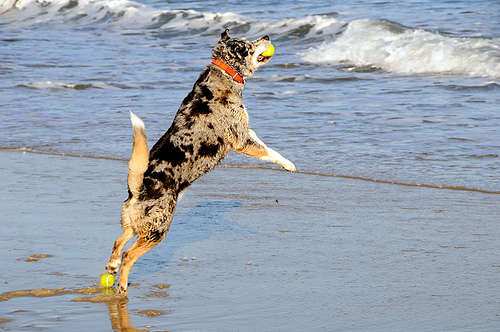

Text query: Two people are running at the top of a mountain .
Predicted Label: 81
3514297698_0512623955.jpg


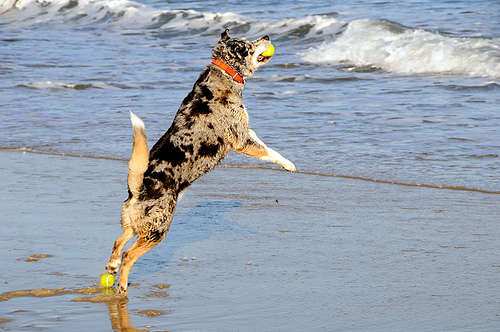

Text query: Two children are playing at a water park .
This image is unavailable in your country in compliance with local laws.

Text query: A young boy jumps off a rock in the forest
This image is unavailable in your country in compliance with local laws.

Text query: A red speed boat crosses the water .
Predicted Label: 64
3163198309_bbfe504f0a.jpg


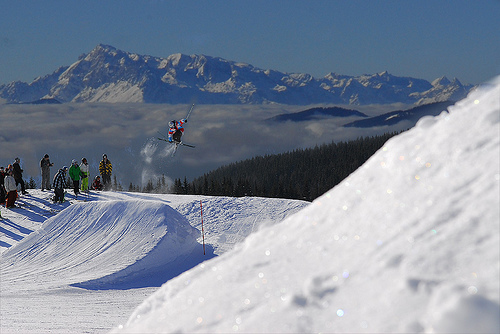

Text query: The small fluffy white dog runs through the green grass with a tiny stick in its mouth .
Predicted Label: 81
3514297698_0512623955.jpg


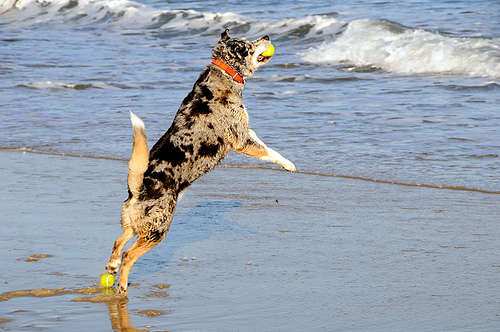

Text query: An Asian woman is taking a photograph outside a white columned building .
Predicted Label: 81
3514297698_0512623955.jpg


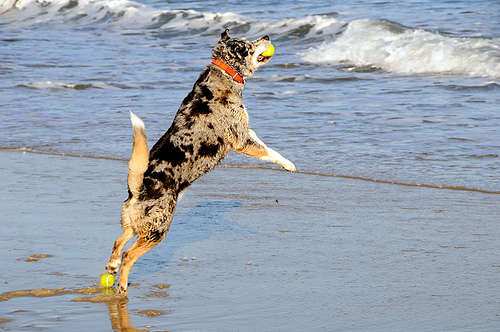

Text query: Two people are running at the top of a mountain .
Predicted Label: 81
3514297698_0512623955.jpg


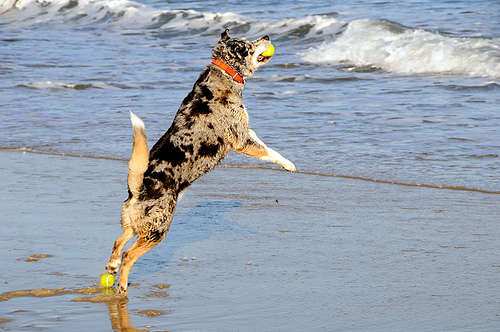

Text query: An Asian woman is taking a photograph outside a white columned building .
Predicted Label: 81
3514297698_0512623955.jpg


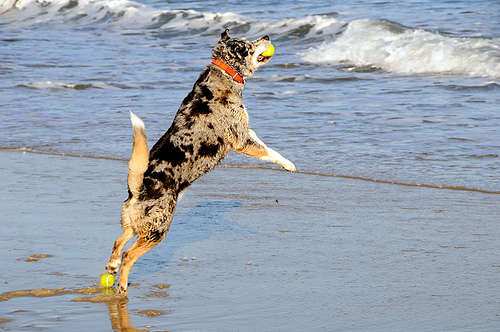

Text query: A man on a waterski is performing a jump in the air .
Predicted Label: 64
3163198309_bbfe504f0a.jpg


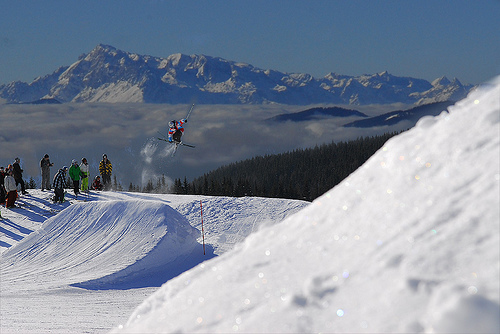

In [93]:
# Функция, которая возвращает 10 случайных текстовых описаний
def ten_texts():
    texts = []
    for _ in range(10):
        random_idx = random.randint(0, len(test_queries) - 1)
        texts.append(test_queries.iloc[random_idx]['query_text'])
    return texts

# Функция, которая преобразует текстовое описание и одно изображение в мультимодальный вектор
def convert_text_and_image_to_vector(text):
    if contains_forbidden_keywords(text):
        return None  # Если текст содержит запретные слова, возвращаем None
    else:
        # Здесь выполняется векторизация текста и объединение с вектором изображения.
        text_vector = vectorize_text(text)
        text_massive = []
        for i in range(0,100):
            text_massive.append(text_vector)
        text_massive = np.array(text_massive)
        # Уберем измерение, которое равно 1
        text_massive = text_massive.squeeze()
        combined_vector = np.hstack([image_vectors_test, text_massive])

        return(combined_vector)

for query in ten_texts():
    print(f"Text query: {query}")
    try:
        combined_vector = convert_text_and_image_to_vector(query)
        if combined_vector is not None:
            res = net.forward(torch.FloatTensor(combined_vector)).flatten().detach().numpy()
            predicted_label = res.argmax()

            if predicted_label < len(test_images):
                print(f"Predicted Label: {predicted_label}")
                image = test_images['image'].iloc[predicted_label]
                print(image)
                # Save the image to a temporary file in a supported format
                temp_image_path = os.path.join(TEST_IMAGE_FOLDER, image)

                # Open and display the image
                img = Image.open(temp_image_path)
                display(img)
            else:
                print(f'Predicted Label {predicted_label} is out of range of available images.')

        else:
            print('This image is unavailable in your country in compliance with local laws.\n')

    except Exception as e:
        print(f'An error occurred while processing the query: {str(e)}')

Результаты разочаровывающие. Судя по всему, модель не подходит для таких целей. И сам подход кажется недееспособным (или я просто что-то не понимаю :) и сделала не так)

Попробуем взять какую-то мощную модель, которая способна работать с текстом и изображением на более продвинутом уровне. Выбор пал на CLIP.

Модель CLIP обладает выдающейся способностью сопоставления текстов и изображений, и это можно объяснить несколькими факторами:

- Преобучение на множестве данных: Модель обучена на огромном объеме данных, включая тексты из Интернета и изображения. Это позволило ей усвоить множество разнообразных концепций и связей между текстами и изображениями.

- Контрастное обучение: CLIP использует принцип контрастного обучения, который помогает ей изучать семантические аспекты изображений и текстов. Она обучается не только сравнивать сходство текстов и изображений, но и различать их. Это способствует лучшему пониманию содержания изображений и текстов.

- Мультимодальная архитектура: Модель имеет мультимодальную архитектуру, что означает, что она может обрабатывать и анализировать данные разных модальностей (текст и изображения) совместно. Это позволяет ей учитывать взаимосвязи между данными разных типов, а не рассматривать их изолированно.

- Обобщение знаний: CLIP способна обобщать знания, извлеченные из обучающего набора данных, для решения новых задач. Это делает ее универсальным инструментом, который можно применять для разнообразных задач, даже если у вас нет большого количества размеченных данных.

- Продвинутая предварительная настройка: Модель была предварительно обучена на данных из Интернета, что дает ей знания о разнообразных темах и концепциях. Это помогает ей анализировать содержание изображений и текстов в контексте широкого спектра доменов и предметных областей.

Эти факторы в совокупности делают CLIP мощным инструментом для сопоставления текста и изображений, и она действительно отлично справляется с этой задачей. Посмотрим это на практике.

Text: A group of teenagers near Simpsons characters .
This image is unavailable in your country in compliance with local laws



Text: A man in a white hat is standing behind a woman with a red shawl over her head .
Best Matching Image: /home/stas/workspace/raisa/DS_project4/to_upload/test_images/3173157541_70b16b4318.jpg (Similarity: 930.1799)


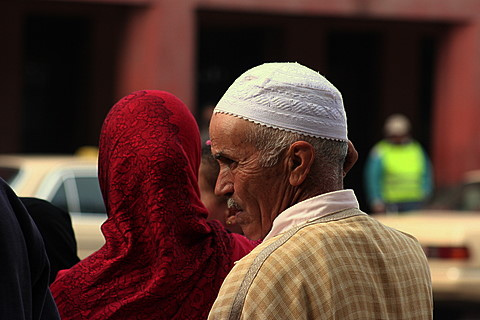




Text: The man is on a black and white bike .
Best Matching Image: /home/stas/workspace/raisa/DS_project4/to_upload/test_images/3517023411_a8fbd15230.jpg (Similarity: 788.6815)


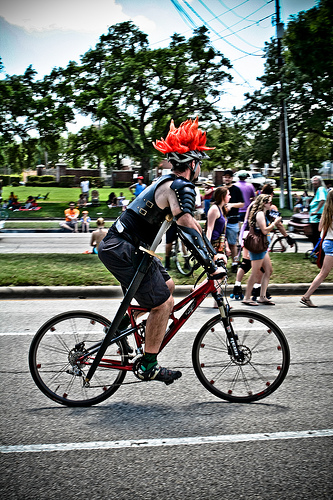




Text: The little boy is smiling as he crosses a rope on an assault course .
This image is unavailable in your country in compliance with local laws



Text: A group of dogs walk around outdoors .
Best Matching Image: /home/stas/workspace/raisa/DS_project4/to_upload/test_images/2709359730_13bca100af.jpg (Similarity: 907.0992)


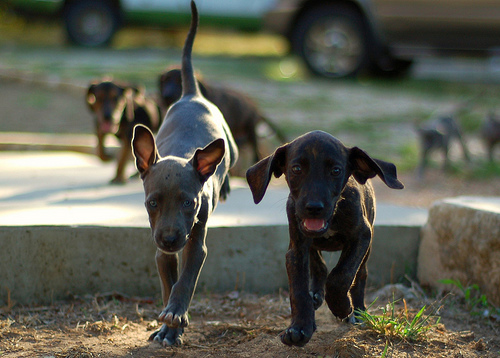




Text: Three people are looking into photographic equipment .
Best Matching Image: /home/stas/workspace/raisa/DS_project4/to_upload/test_images/2346402952_e47d0065b6.jpg (Similarity: 729.9656)


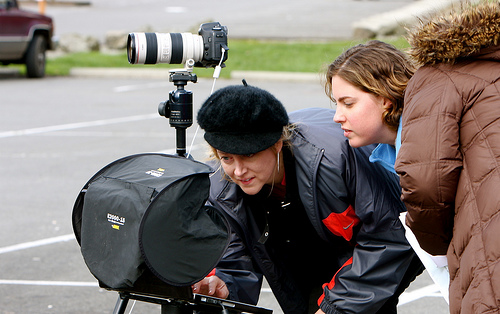




Text: The boy jumps into the water off of a dock .
This image is unavailable in your country in compliance with local laws



Text: The woman with a henna tattoo holds a piece of paper in her left hand .
Best Matching Image: /home/stas/workspace/raisa/DS_project4/to_upload/test_images/2687672606_275169c35d.jpg (Similarity: 1032.4976)


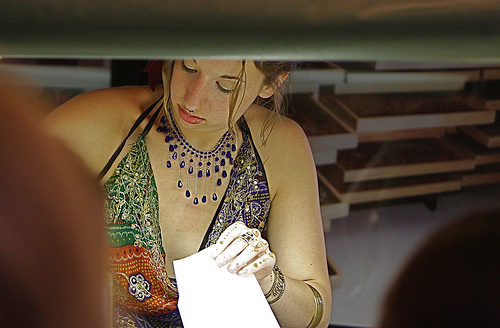




Text: A young girl in blue hat and coat is riding a tricycle .
This image is unavailable in your country in compliance with local laws



Text: Two children are playing at a water park .
This image is unavailable in your country in compliance with local laws





In [96]:
# Define the path to the folder containing test images
TEST_IMAGE_FOLDER = "/home/stas/workspace/raisa/DS_project4/to_upload/test_images"  # Replace with your folder path

# Create a CLIP processor and model
device = "cuda" if torch.cuda.is_available() else "cpu"
processor = CLIPProcessor.from_pretrained("openai/clip-vit-base-patch16", device=device)
model = CLIPModel.from_pretrained("openai/clip-vit-base-patch16").to(device)

# Load your test_queries dataframe with 'query_text' column

# List image files in the test images folder
image_files = [f for f in os.listdir(TEST_IMAGE_FOLDER) if f.lower().endswith(('.png', '.jpg', '.jpeg', '.gif', '.bmp', '.tiff'))]

# Track if the warning message has been displayed
warning_displayed = False

# Randomly select 10 text descriptions
random_text_descriptions = random.sample(test_queries['query_text'].tolist(), 10)

# Keep track of the best match and its similarity score
for text in random_text_descriptions:
    best_match = None
    best_similarity = -1  # Initialize with a very low similarity score
    
    for image_file in image_files:
        image_path = os.path.join(TEST_IMAGE_FOLDER, image_file)
        image = Image.open(image_path)
        
        # Check for forbidden keywords in the text
        if contains_forbidden_keywords(text):
            if not warning_displayed:
                #print("This image is unavailable in your country in compliance with local laws")
                warning_displayed = True
            break  # Skip the image if it contains forbidden keywords
        
        similarity = calculate_similarity(text, image)
        
        if similarity > best_similarity:
            best_similarity = similarity
            best_match = image_path
    
    print(f"Text: {text}")
    if best_match:
        print(f"Best Matching Image: {best_match} (Similarity: {best_similarity:.4f})")
        img = Image.open(best_match)
        display(img)
    else:
        print("This image is unavailable in your country in compliance with local laws")
    print()
    print("\n")

## 8. Выводы

В ходе исследования данных и разработки прототипа по поиску изображения по запросу пользователей мы столкнулись с рядом сложностей. Начиная от несоответствии количества данных по оценкам от экспертов и краудсорса, заканчивая настройками базовых моделей для решения нашей задачи.

Обученная нейросеть показывает сомнительные результаты, поэтому для сравнения мы решили воспользоваться более продвинутой моделью, которая в разы превосходит разработанную нами нейросеть. Конечно же, СLIP выступает более мощной альтернативой, ведь она обучена на огромном количестве информации по нашему профилю - сопоставления описания картинке. Эта модель практически безупречно определяет по текстовому запросу фотографию и при этом не требует большого количества данных, затрат на оценку от сообщества или экспертов. Такой подход видится более продвинутым, но в то же время, стоит помнить о природе данной модели. Это оупенсорсная модель, которая сейчас доступна для использования. Но для бизнеса, который намерен получать прибыль, важно углубиться в лицензионное право, чтобы применять подобные технологии. В качестве прототипа, безусловно, можно рекомендовать данную модель как лучшее решение поставленной задачи.

- [x]  Jupyter Notebook открыт
- [x]  Весь код выполняется без ошибок
- [x]  Ячейки с кодом расположены в порядке исполнения
- [x]  Исследовательский анализ данных выполнен
- [x]  Проверены экспертные оценки и краудсорсинговые оценки
- [x]  Из датасета исключены те объекты, которые выходят за рамки юридических ограничений
- [x]  Изображения векторизованы
- [x]  Текстовые запросы векторизованы
- [x]  Данные корректно разбиты на тренировочную и тестовую выборки
- [x]  Предложена метрика качества работы модели
- [x]  Предложена модель схожести изображений и текстового запроса
- [x]  Модель обучена
- [x]  По итогам обучения модели сделаны выводы
- [x]  Проведено тестирование работы модели
- [x]  По итогам тестирования визуально сравнили качество поиска